In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import morphology, filters, feature, measure
from skimage.morphology import skeletonize, disk
from scipy import ndimage
import warnings
warnings.filterwarnings('ignore')
import os
import glob
from pathlib import Path
import pandas as pd
import kagglehub

Use Kaggle dataset? (y/n, default=y): y
Bone Fracture Detection with Kaggle Dataset
Using Colab cache for faster access to the 'bone-fracture-dataset' dataset.
Path to dataset files: /kaggle/input/bone-fracture-dataset
Loading dataset from: /kaggle/input/bone-fracture-dataset
Dataset loaded:
- Total images: 2127
- Fractured images: 2127
- Non-fractured images: 0
- Uncategorized images: 0

Choose analysis option:
1. Analyze single random image
2. Process batch of images (first 10)
3. Process all images
4. Run performance evaluation
Enter choice (1-4): 2
Processing 10 images from dataset...

Processing image 1/10: 379.png
Image loaded successfully. Shape: (1000, 810)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 719 potential fracture points
Skeleton analysis: 5 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 20/100
LOW probability of fra

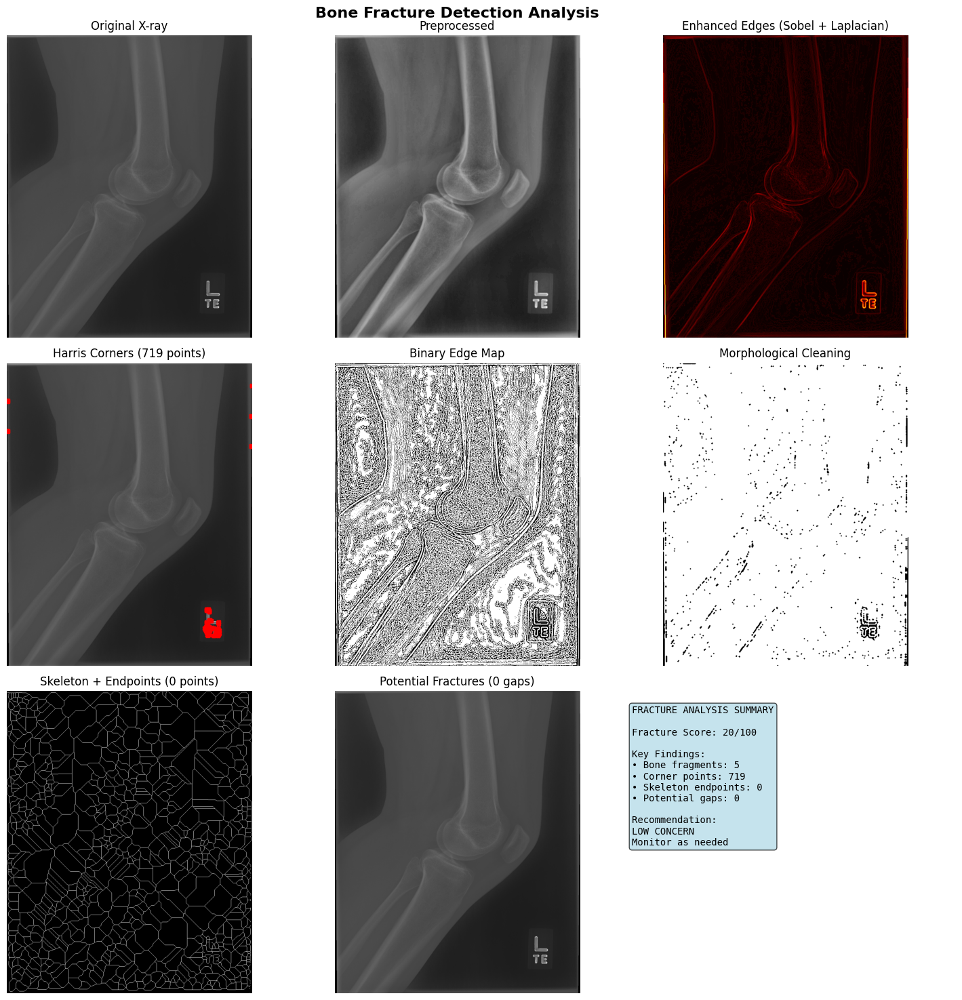

Report saved to batch_results_1/report_379.txt

Processing image 2/10: 340.png
Image loaded successfully. Shape: (978, 1000)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 755 potential fracture points
Skeleton analysis: 3 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 20/100
LOW probability of fracture
- High number of sharp bone features (755 corners)
Fracture detection completed!
Results saved to batch_results_2/analysis_340.png


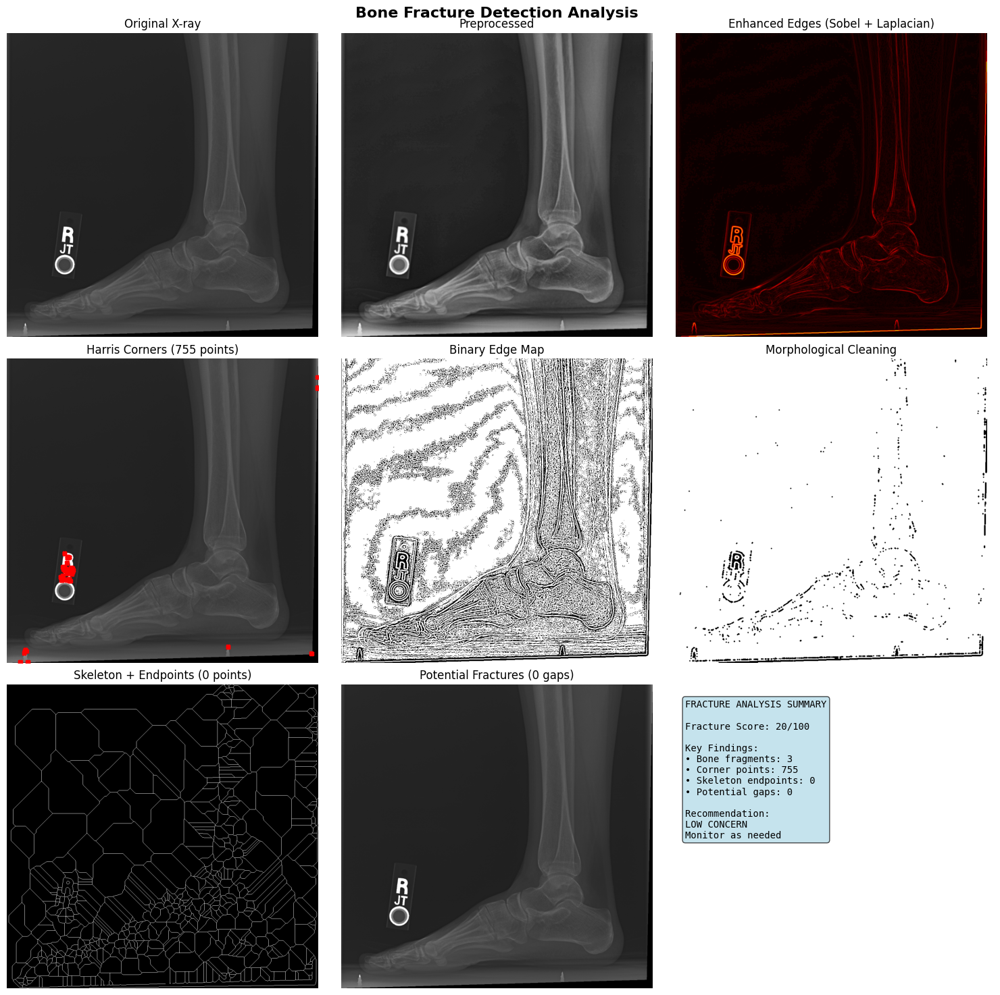

Report saved to batch_results_2/report_340.txt

Processing image 3/10: 48.png
Image loaded successfully. Shape: (1000, 804)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 930 potential fracture points
Skeleton analysis: 2 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 20/100
LOW probability of fracture
- High number of sharp bone features (930 corners)
Fracture detection completed!
Results saved to batch_results_3/analysis_48.png


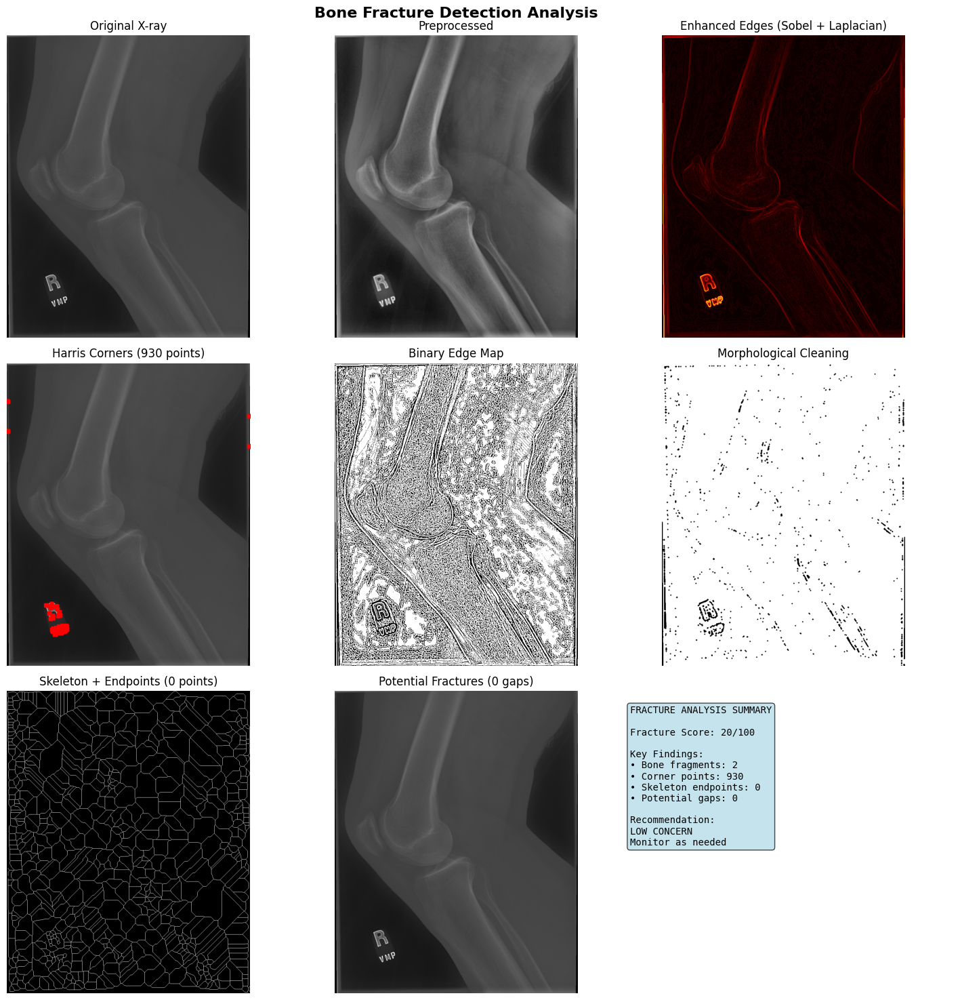

Report saved to batch_results_3/report_48.txt

Processing image 4/10: 227.png
Image loaded successfully. Shape: (1000, 804)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 667 potential fracture points
Skeleton analysis: 1 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 20/100
LOW probability of fracture
- High number of sharp bone features (667 corners)
Fracture detection completed!
Results saved to batch_results_4/analysis_227.png


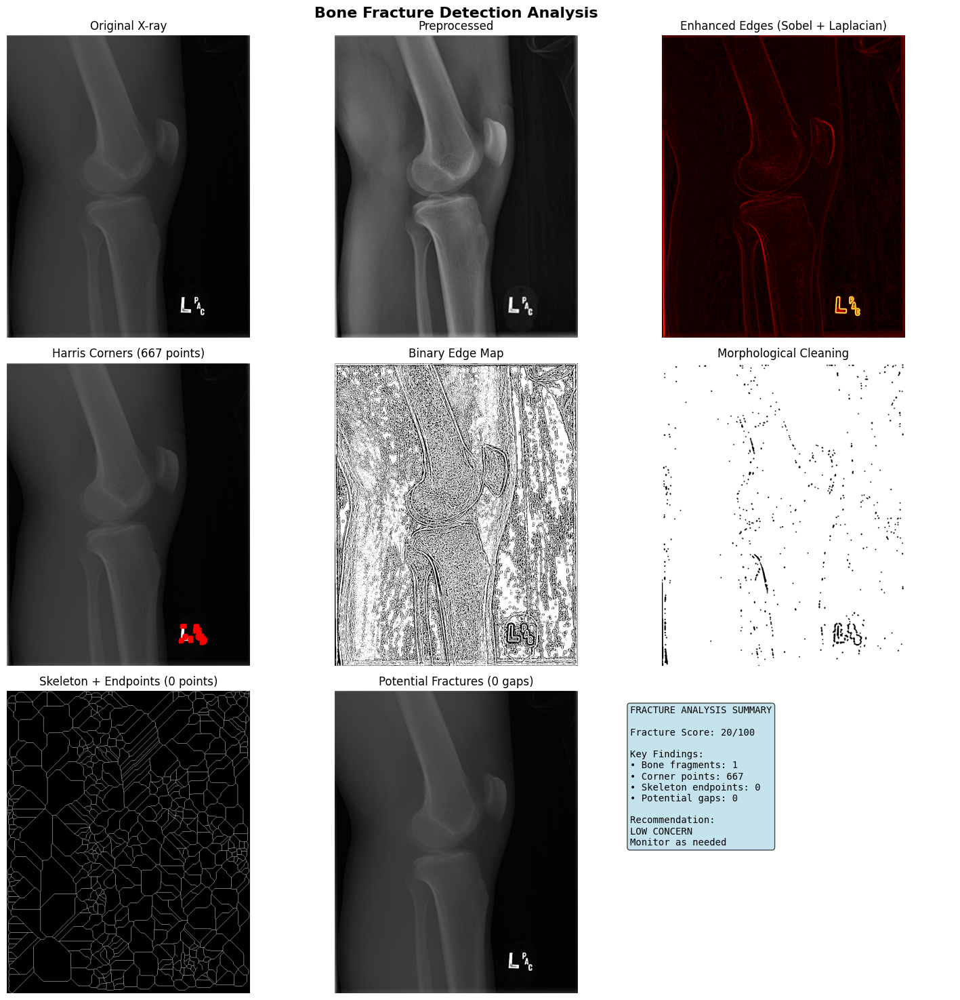

Report saved to batch_results_4/report_227.txt

Processing image 5/10: 61.png
Image loaded successfully. Shape: (1000, 794)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 563 potential fracture points
Skeleton analysis: 1 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 20/100
LOW probability of fracture
- High number of sharp bone features (563 corners)
Fracture detection completed!
Results saved to batch_results_5/analysis_61.png


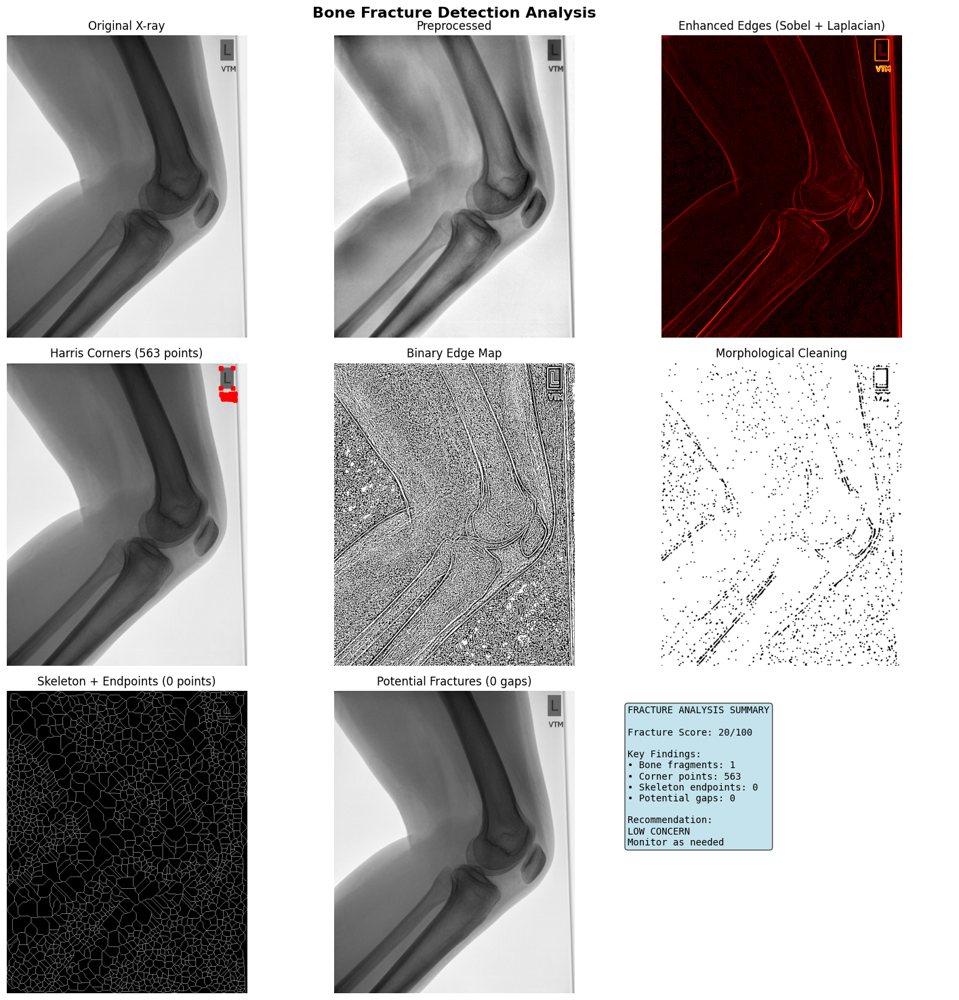

Report saved to batch_results_5/report_61.txt

Processing image 6/10: 377.png
Image loaded successfully. Shape: (1000, 810)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 719 potential fracture points
Skeleton analysis: 5 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 20/100
LOW probability of fracture
- High number of sharp bone features (719 corners)
Fracture detection completed!
Results saved to batch_results_6/analysis_377.png


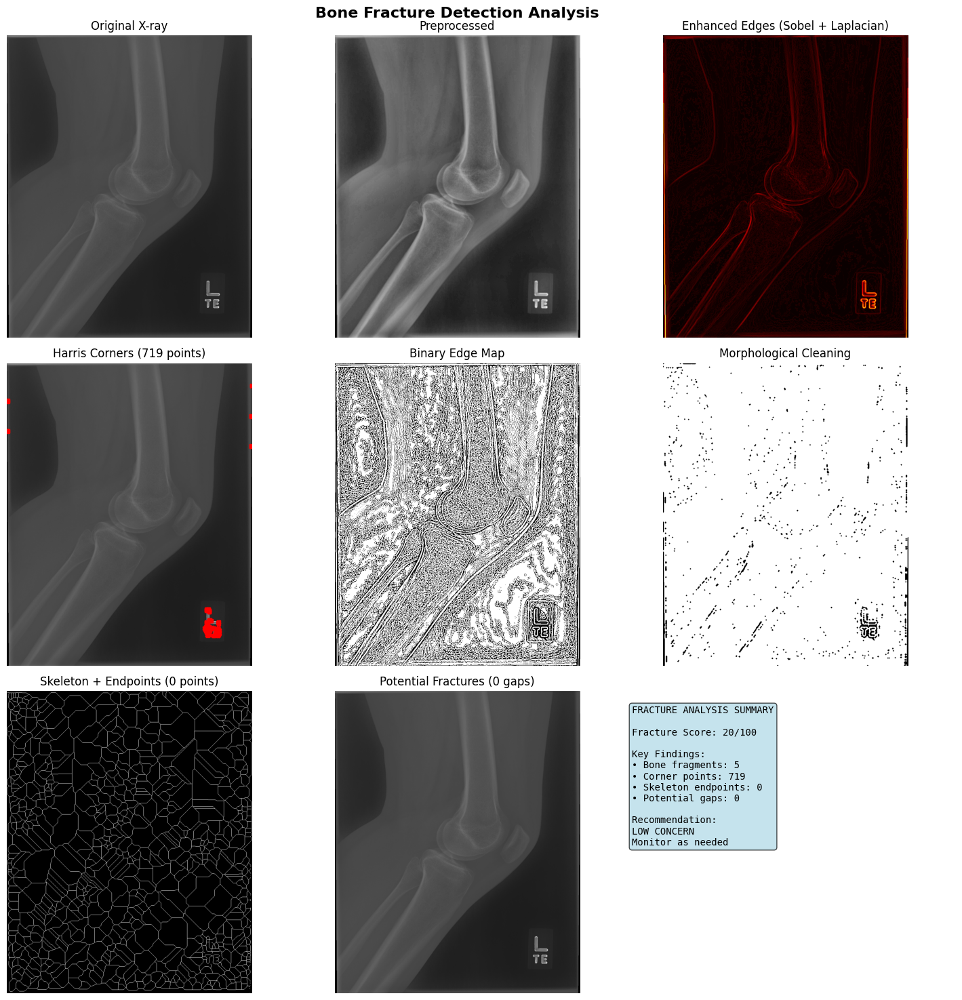

Report saved to batch_results_6/report_377.txt

Processing image 7/10: 222.png
Image loaded successfully. Shape: (1000, 804)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 667 potential fracture points
Skeleton analysis: 1 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 20/100
LOW probability of fracture
- High number of sharp bone features (667 corners)
Fracture detection completed!
Results saved to batch_results_7/analysis_222.png


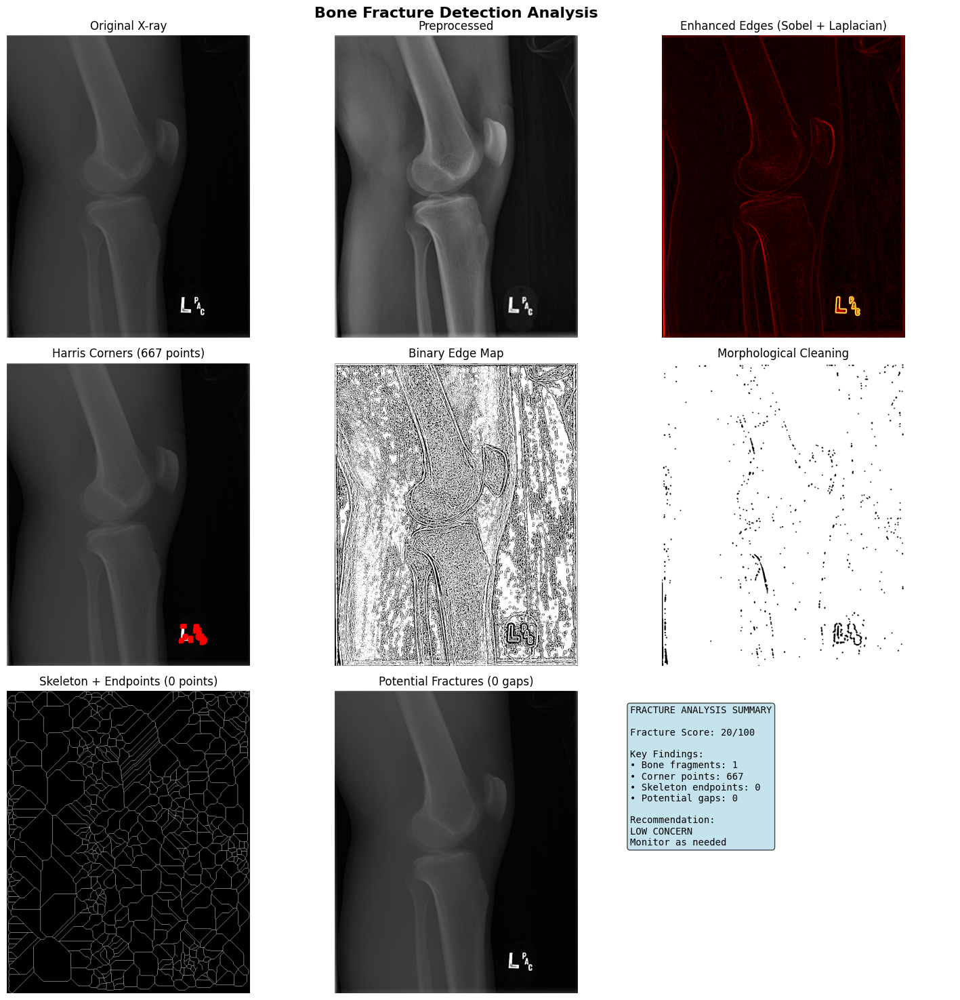

Report saved to batch_results_7/report_222.txt

Processing image 8/10: 37.png
Image loaded successfully. Shape: (1000, 932)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 649 potential fracture points
Skeleton analysis: 19 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 50/100
MODERATE probability of fracture detected
- Multiple bone fragments detected (19 components)
- High number of sharp bone features (649 corners)
Fracture detection completed!
Results saved to batch_results_8/analysis_37.png


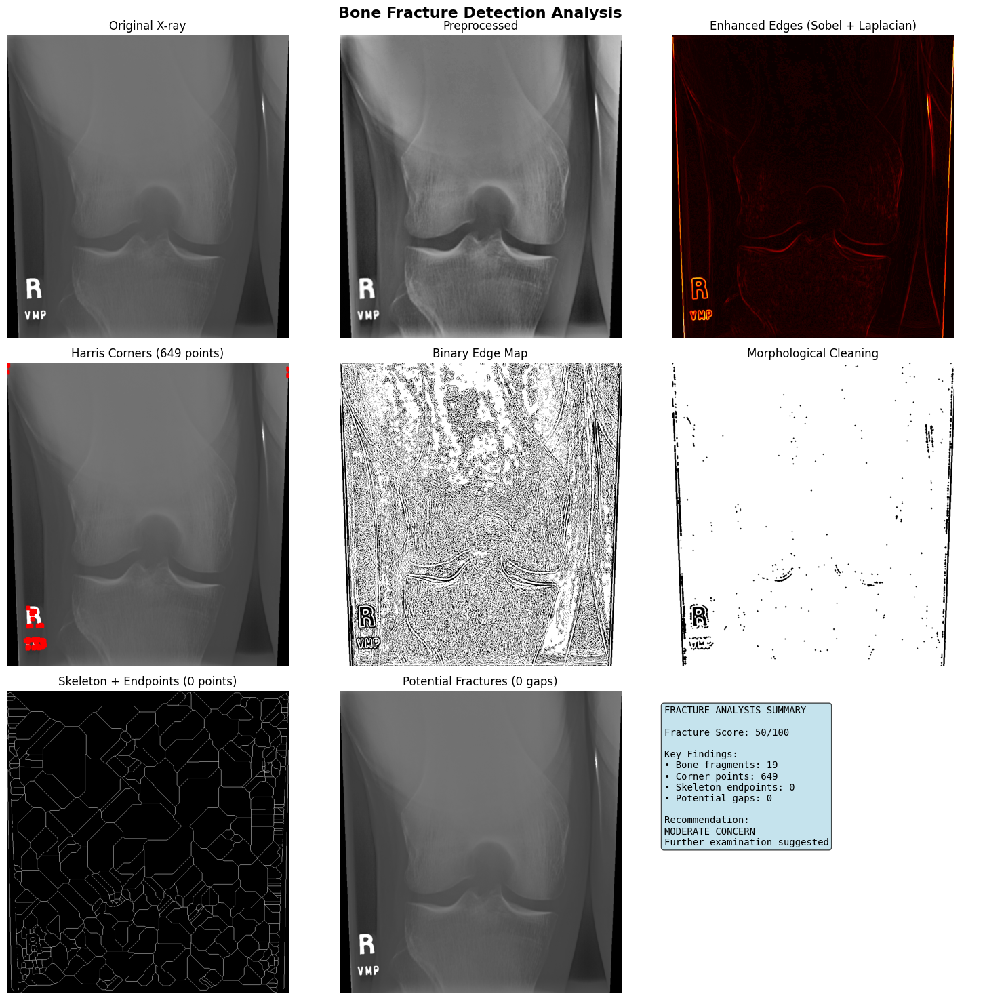

Report saved to batch_results_8/report_37.txt

Processing image 9/10: 35.png
Image loaded successfully. Shape: (819, 999)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 2130 potential fracture points
Skeleton analysis: 1 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 20/100
LOW probability of fracture
- High number of sharp bone features (2130 corners)
Fracture detection completed!
Results saved to batch_results_9/analysis_35.png


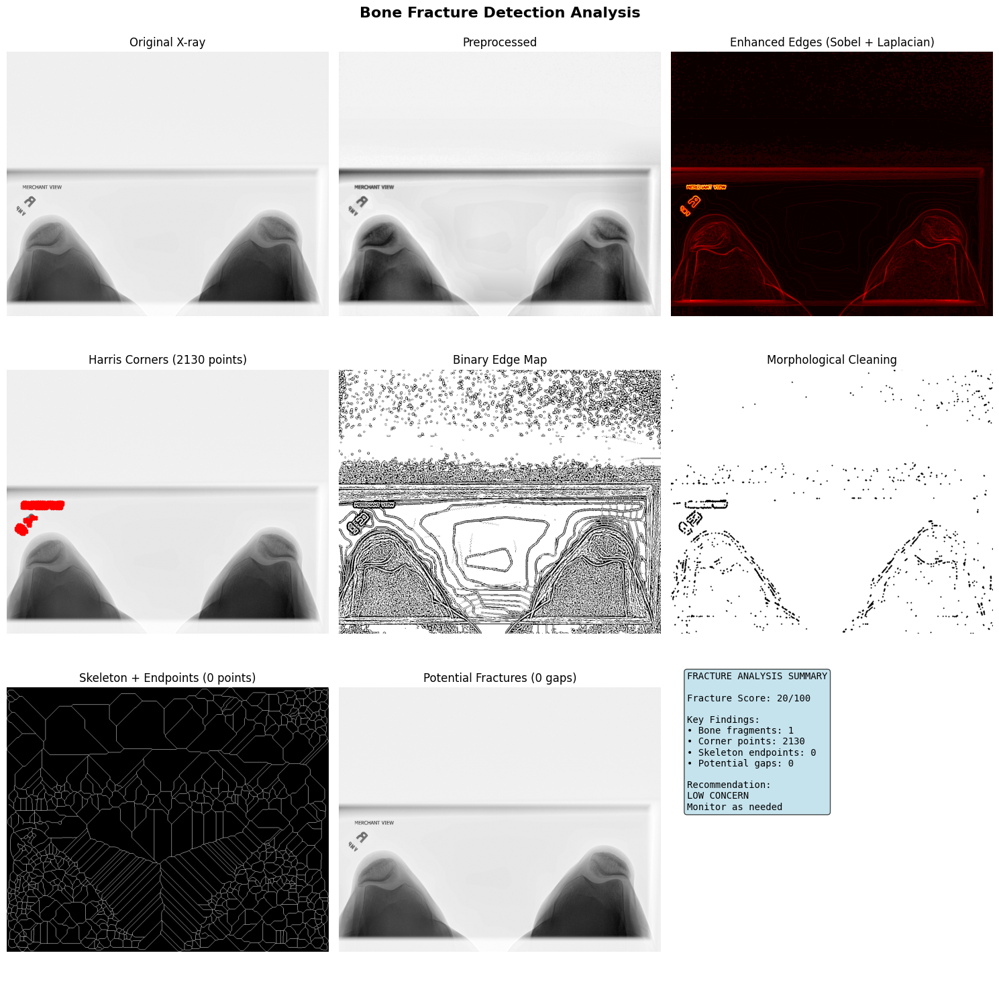

Report saved to batch_results_9/report_35.txt

Processing image 10/10: 384.png
Image loaded successfully. Shape: (1000, 760)
Starting bone fracture detection...
Preprocessing completed
Edge enhancement completed
Detected 505 potential fracture points
Skeleton analysis: 2 connected components, 0 endpoints
Potential fracture gaps: 0
Morphological analysis completed

Fracture Analysis Results:
Fracture Probability Score: 20/100
LOW probability of fracture
- High number of sharp bone features (505 corners)
Fracture detection completed!
Results saved to batch_results_10/analysis_384.png


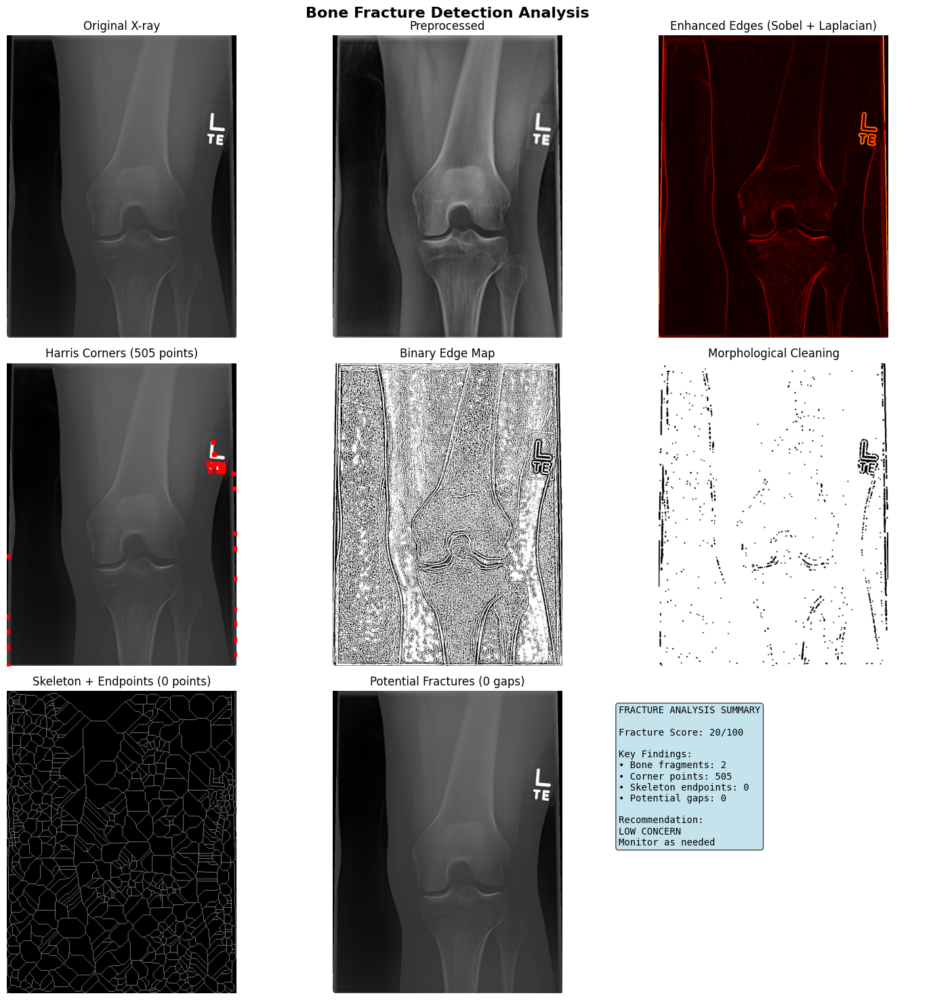

Report saved to batch_results_10/report_384.txt

Batch processing completed!
Accuracy: 0.000, Precision: 0.000, Recall: 0.000, F1: 0.000
Results saved to:
- batch_analysis_summary.csv
- batch_performance_report.txt


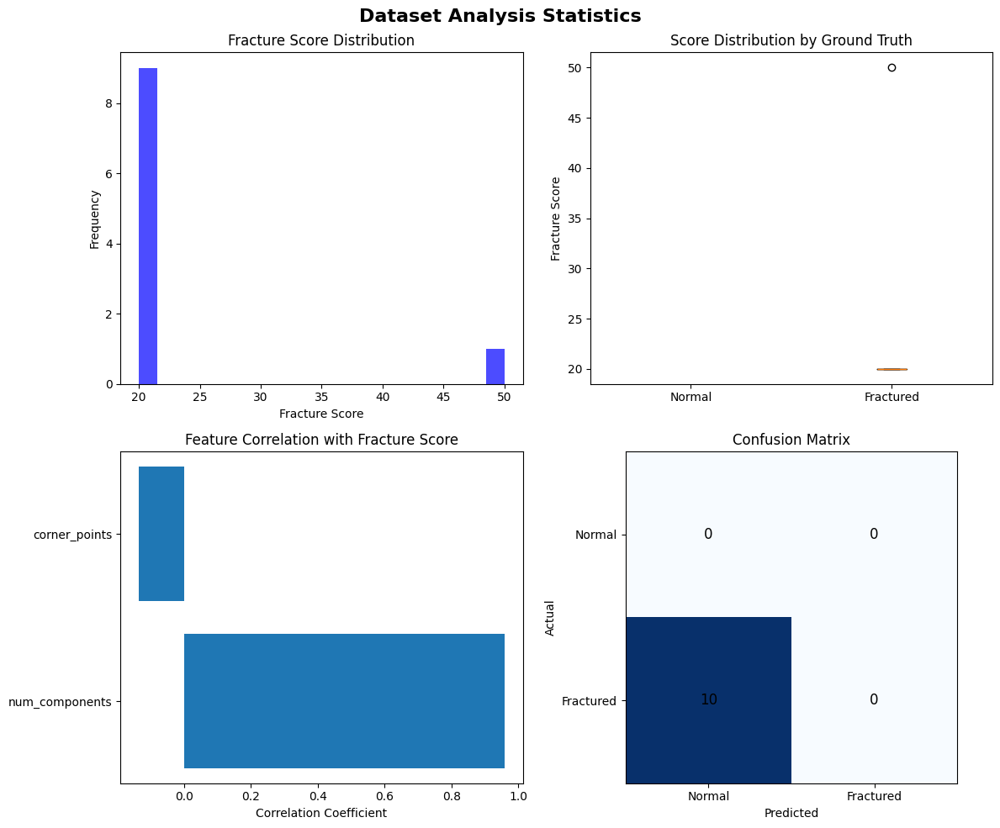

Dataset statistics saved as 'dataset_analysis_statistics.png'

USAGE EXAMPLES:

1. With Kaggle dataset:
   detector = BoneFractureDetector.download_dataset()
   detector = BoneFractureDetector(dataset_path)
   detector.process_dataset_batch(max_images=10)
   detector.analyze_dataset_statistics()

2. Single image analysis:
   detector = BoneFractureDetector()
   detector.load_image('your_xray.jpg')
   detector.detect_fractures()
   detector.visualize_results()


In [ ]:
class BoneFractureDetector:
    def __init__(self, dataset_path=None):
        self.original_image = None
        self.preprocessed_image = None
        self.enhanced_image = None
        self.skeleton = None
        self.fracture_points = []
        self.results = {}
        self.dataset_path = dataset_path
        self.dataset_images = []
        self.batch_results = []

        if dataset_path:
            self.load_dataset()

#load dataset
    def load_dataset(self):
        """Load and organize the Kaggle bone fracture dataset"""
        if not self.dataset_path or not os.path.exists(self.dataset_path):
            print("Dataset path not found")
            return False

        print(f"Loading dataset from: {self.dataset_path}")

        # Look for common image extensions
        image_extensions = ['*.jpg', '*.jpeg', '*.png', '*.bmp', '*.tiff']

        # Search for images in all subdirectories
        for ext in image_extensions:
            self.dataset_images.extend(glob.glob(os.path.join(self.dataset_path, '**', ext), recursive=True))

        # Organize images by categories (fractured vs non-fractured)
        self.fractured_images = []
        self.non_fractured_images = []

        for img_path in self.dataset_images:
            path_lower = img_path.lower()
            if 'fracture' in path_lower or 'fractured' in path_lower or 'broken' in path_lower:
                self.fractured_images.append(img_path)
            elif 'normal' in path_lower or 'healthy' in path_lower or 'no' in path_lower:
                self.non_fractured_images.append(img_path)

        print(f"Dataset loaded:")
        print(f"- Total images: {len(self.dataset_images)}")
        print(f"- Fractured images: {len(self.fractured_images)}")
        print(f"- Non-fractured images: {len(self.non_fractured_images)}")
        print(f"- Uncategorized images: {len(self.dataset_images) - len(self.fractured_images) - len(self.non_fractured_images)}")

        return True

    @staticmethod
    def download_dataset():
        """Download the Kaggle bone fracture dataset"""
        try:
            print("Downloading bone fracture dataset from Kaggle...")
            path = kagglehub.dataset_download("orvile/bone-fracture-dataset")
            print("Path to dataset files:", path)
            return path
        except Exception as e:
            print(f"Error downloading dataset: {e}")
            return None
    def load_image(self, image_path):
        """Load and convert image to grayscale"""
        try:
            self.original_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            if self.original_image is None:
                raise ValueError("Could not load image")

            # Resize if image is too large (for processing efficiency)
            if self.original_image.shape[0] > 1000 or self.original_image.shape[1] > 1000:
                scale_factor = min(1000 / self.original_image.shape[0], 1000 / self.original_image.shape[1])
                new_width = int(self.original_image.shape[1] * scale_factor)
                new_height = int(self.original_image.shape[0] * scale_factor)
                self.original_image = cv2.resize(self.original_image, (new_width, new_height))

            print(f"Image loaded successfully. Shape: {self.original_image.shape}")
        except Exception as e:
            print(f"Error loading image: {e}")
            return False
        return True

    def preprocess_image(self):
        """Apply preprocessing techniques"""
        if self.original_image is None:
            print("No image loaded")
            return

        # Noise reduction with Gaussian blur
        denoised = cv2.GaussianBlur(self.original_image, (5, 5), 0)

        # Contrast enhancement using CLAHE
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        enhanced = clahe.apply(denoised)

        # Normalize intensity values
        self.preprocessed_image = cv2.normalize(enhanced, None, 0, 255, cv2.NORM_MINMAX)

        print("Preprocessing completed")

    def enhance_bone_edges(self):
        """Apply Sobel and Laplacian filters to highlight bone edges"""
        if self.preprocessed_image is None:
            print("Image not preprocessed")
            return

        # Sobel edge detection
        sobel_x = cv2.Sobel(self.preprocessed_image, cv2.CV_64F, 1, 0, ksize=3)
        sobel_y = cv2.Sobel(self.preprocessed_image, cv2.CV_64F, 0, 1, ksize=3)
        sobel_combined = np.sqrt(sobel_x**2 + sobel_y**2)

        # Laplacian edge detection
        laplacian = cv2.Laplacian(self.preprocessed_image, cv2.CV_64F, ksize=3)
        laplacian = np.absolute(laplacian)

        # Combine Sobel and Laplacian
        combined_edges = 0.7 * sobel_combined + 0.3 * laplacian

        # Normalize and convert to uint8
        self.enhanced_image = cv2.normalize(combined_edges, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

        # Apply adaptive thresholding to create binary edge map
        self.binary_edges = cv2.adaptiveThreshold(
            self.enhanced_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
        )

        print("Edge enhancement completed")

        self.results['sobel_magnitude'] = sobel_combined
        self.results['laplacian'] = laplacian
        self.results['enhanced_edges'] = self.enhanced_image

    def detect_interest_points(self):
        """Use Harris corner detection to identify potential fracture endpoints"""
        if self.enhanced_image is None:
            print("Image not enhanced")
            return

        # Harris corner detection
        harris_response = cv2.cornerHarris(self.enhanced_image, blockSize=2, ksize=3, k=0.04)

        # Dilate corner points for better visualization
        harris_response = cv2.dilate(harris_response, None)

        # Threshold for corner detection
        threshold = 0.01 * harris_response.max()
        corner_points = np.where(harris_response > threshold)

        # Store corner coordinates
        self.fracture_points = list(zip(corner_points[1], corner_points[0]))  # (x, y) format

        print(f"Detected {len(self.fracture_points)} potential fracture points")

        self.results['harris_response'] = harris_response
        self.results['corner_points'] = self.fracture_points

    def perform_morphological_analysis(self):
        """Apply morphological operations and skeletonization"""
        if self.binary_edges is None:
            print("Binary edges not available")
            return

        # Morphological operations to clean up the binary image
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3, 3))

        # Morphological closing to connect nearby edge segments
        closed = cv2.morphologyEx(self.binary_edges, cv2.MORPH_CLOSE, kernel, iterations=2)

        # Morphological opening to remove small noise
        opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel, iterations=1)

        # Skeletonization to get the medial axis of bone structures
        # Convert to boolean for skimage
        binary_bool = opened > 0
        self.skeleton = skeletonize(binary_bool)

        # Analyze skeleton connectivity
        self.analyze_skeleton_continuity()

        print("Morphological analysis completed")

        self.results['morphology_closed'] = closed
        self.results['morphology_opened'] = opened
        self.results['skeleton'] = self.skeleton

    def analyze_skeleton_continuity(self):
        """Analyze skeleton for potential fracture discontinuities"""
        if self.skeleton is None:
            return

        # Label connected components in skeleton
        labeled_skeleton = measure.label(self.skeleton)
        regions = measure.regionprops(labeled_skeleton)

        # Find potential fracture gaps
        fracture_gaps = []
        skeleton_uint8 = (self.skeleton * 255).astype(np.uint8)

        # Look for endpoints in skeleton (pixels with only one neighbor)
        kernel = np.ones((3, 3), np.uint8)
        neighbors = cv2.filter2D(skeleton_uint8, -1, kernel) - skeleton_uint8
        endpoints = np.where((skeleton_uint8 > 0) & (neighbors == 255))

        self.skeleton_endpoints = list(zip(endpoints[1], endpoints[0]))  # (x, y) format

        # Analyze gaps between nearby endpoints
        for i, point1 in enumerate(self.skeleton_endpoints):
            for j, point2 in enumerate(self.skeleton_endpoints[i+1:], i+1):
                distance = np.sqrt((point1[0] - point2[0])**2 + (point1[1] - point2[1])**2)
                if 5 < distance < 30:  # Potential fracture gap
                    fracture_gaps.append((point1, point2, distance))

        self.results['skeleton_endpoints'] = self.skeleton_endpoints
        self.results['potential_fractures'] = fracture_gaps
        self.results['num_components'] = len(regions)

        print(f"Skeleton analysis: {len(regions)} connected components, {len(self.skeleton_endpoints)} endpoints")
        print(f"Potential fracture gaps: {len(fracture_gaps)}")

    def detect_fractures(self):
        """Main fracture detection pipeline"""
        print("Starting bone fracture detection...")

        if self.original_image is None:
            print("No image loaded")
            return False

        # Run the complete pipeline
        self.preprocess_image()
        self.enhance_bone_edges()
        self.detect_interest_points()
        self.perform_morphological_analysis()

        # Generate fracture probability score
        self.calculate_fracture_score()

        print("Fracture detection completed!")
        return True

    def calculate_fracture_score(self):
        """Calculate a fracture probability score based on detected features"""
        score = 0
        reasons = []

        # Score based on number of skeleton components (more components = higher fracture probability)
        if 'num_components' in self.results:
            if self.results['num_components'] > 5:
                score += 30
                reasons.append(f"Multiple bone fragments detected ({self.results['num_components']} components)")

        # Score based on skeleton endpoints (more endpoints = potential fractures)
        if 'skeleton_endpoints' in self.results:
            endpoint_count = len(self.results['skeleton_endpoints'])
            if endpoint_count > 10:
                score += 25
                reasons.append(f"High number of bone discontinuities ({endpoint_count} endpoints)")

        # Score based on potential fracture gaps
        if 'potential_fractures' in self.results:
            gap_count = len(self.results['potential_fractures'])
            if gap_count > 2:
                score += 35
                reasons.append(f"Suspected fracture gaps detected ({gap_count} gaps)")

        # Score based on Harris corner points (fracture endpoints often appear as corners)
        if 'corner_points' in self.results:
            corner_count = len(self.results['corner_points'])
            if corner_count > 20:
                score += 20
                reasons.append(f"High number of sharp bone features ({corner_count} corners)")

        # Normalize score to 0-100
        score = min(score, 100)

        self.results['fracture_score'] = score
        self.results['fracture_reasons'] = reasons

        print(f"\nFracture Analysis Results:")
        print(f"Fracture Probability Score: {score}/100")
        if score > 60:
            print("HIGH probability of fracture detected!")
        elif score > 30:
            print("MODERATE probability of fracture detected")
        else:
            print("LOW probability of fracture")

        for reason in reasons:
            print(f"- {reason}")

    def visualize_results(self, save_path=None):
        """Create comprehensive visualization of all results"""
        fig, axes = plt.subplots(3, 3, figsize=(15, 15))
        fig.suptitle('Bone Fracture Detection Analysis', fontsize=16, fontweight='bold')

        # Original image
        axes[0, 0].imshow(self.original_image, cmap='gray')
        axes[0, 0].set_title('Original X-ray')
        axes[0, 0].axis('off')

        # Preprocessed image
        axes[0, 1].imshow(self.preprocessed_image, cmap='gray')
        axes[0, 1].set_title('Preprocessed')
        axes[0, 1].axis('off')

        # Enhanced edges
        axes[0, 2].imshow(self.enhanced_image, cmap='hot')
        axes[0, 2].set_title('Enhanced Edges (Sobel + Laplacian)')
        axes[0, 2].axis('off')

        # Harris corners
        axes[1, 0].imshow(self.original_image, cmap='gray')
        if 'corner_points' in self.results:
            corners = np.array(self.results['corner_points'])
            if len(corners) > 0:
                axes[1, 0].scatter(corners[:, 0], corners[:, 1], c='red', s=10, marker='x')
        axes[1, 0].set_title(f'Harris Corners ({len(self.fracture_points)} points)')
        axes[1, 0].axis('off')

        # Binary edges
        axes[1, 1].imshow(self.binary_edges, cmap='gray')
        axes[1, 1].set_title('Binary Edge Map')
        axes[1, 1].axis('off')

        # Morphological operations
        if 'morphology_opened' in self.results:
            axes[1, 2].imshow(self.results['morphology_opened'], cmap='gray')
            axes[1, 2].set_title('Morphological Cleaning')
            axes[1, 2].axis('off')

        # Skeleton
        axes[2, 0].imshow(self.skeleton, cmap='gray')
        if 'skeleton_endpoints' in self.results:
            endpoints = np.array(self.results['skeleton_endpoints'])
            if len(endpoints) > 0:
                axes[2, 0].scatter(endpoints[:, 0], endpoints[:, 1], c='red', s=20, marker='o')
        axes[2, 0].set_title(f'Skeleton + Endpoints ({len(self.skeleton_endpoints)} points)')
        axes[2, 0].axis('off')

        # Potential fractures overlay
        axes[2, 1].imshow(self.original_image, cmap='gray')
        if 'potential_fractures' in self.results:
            for gap in self.results['potential_fractures']:
                point1, point2, distance = gap
                axes[2, 1].plot([point1[0], point2[0]], [point1[1], point2[1]], 'r-', linewidth=2)
                axes[2, 1].scatter([point1[0], point2[0]], [point1[1], point2[1]], c='red', s=50)
        axes[2, 1].set_title(f'Potential Fractures ({len(self.results.get("potential_fractures", []))} gaps)')
        axes[2, 1].axis('off')

        # Results summary
        axes[2, 2].axis('off')
        summary_text = f"""FRACTURE ANALYSIS SUMMARY

Fracture Score: {self.results.get('fracture_score', 0)}/100

Key Findings:
• Bone fragments: {self.results.get('num_components', 0)}
• Corner points: {len(self.results.get('corner_points', []))}
• Skeleton endpoints: {len(self.results.get('skeleton_endpoints', []))}
• Potential gaps: {len(self.results.get('potential_fractures', []))}

Recommendation:
"""

        score = self.results.get('fracture_score', 0)
        if score > 60:
            summary_text += "HIGH PRIORITY\nImmediate medical attention recommended"
        elif score > 30:
            summary_text += "MODERATE CONCERN\nFurther examination suggested"
        else:
            summary_text += "LOW CONCERN\nMonitor as needed"

        axes[2, 2].text(0.05, 0.95, summary_text, transform=axes[2, 2].transAxes,
                       fontsize=10, verticalalignment='top', fontfamily='monospace',
                       bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Results saved to {save_path}")

        plt.show()

    def save_report(self, filename="fracture_report.txt"):
        """Save detailed analysis report"""
        with open(filename, 'w') as f:
            f.write("BONE FRACTURE DETECTION REPORT\n")
            f.write("=" * 50 + "\n\n")

            f.write(f"Fracture Probability Score: {self.results.get('fracture_score', 0)}/100\n\n")

            f.write("DETAILED FINDINGS:\n")
            f.write(f"- Connected bone components: {self.results.get('num_components', 0)}\n")
            f.write(f"- Harris corner points detected: {len(self.results.get('corner_points', []))}\n")
            f.write(f"- Skeleton endpoint count: {len(self.results.get('skeleton_endpoints', []))}\n")
            f.write(f"- Potential fracture gaps: {len(self.results.get('potential_fractures', []))}\n\n")

            if 'fracture_reasons' in self.results:
                f.write("ANALYSIS REASONS:\n")
                for reason in self.results['fracture_reasons']:
                    f.write(f"- {reason}\n")

            f.write(f"\nRECOMMENDATION:\n")
            score = self.results.get('fracture_score', 0)
            if score > 60:
                f.write("HIGH PRIORITY - Immediate medical attention recommended\n")
            elif score > 30:
                f.write("MODERATE CONCERN - Further examination suggested\n")
            else:
                f.write("LOW CONCERN - Monitor as needed\n")

        print(f"Report saved to {filename}")

    def process_dataset_batch(self, max_images=None, save_results=True):
        """Process multiple images from the dataset"""
        if not self.dataset_images:
            print("No dataset loaded")
            return

        images_to_process = self.dataset_images[:max_images] if max_images else self.dataset_images

        print(f"Processing {len(images_to_process)} images from dataset...")

        results_summary = []

        for i, img_path in enumerate(images_to_process):
            print(f"\nProcessing image {i+1}/{len(images_to_process)}: {os.path.basename(img_path)}")

            # Load and analyze image
            if self.load_image(img_path):
                success = self.detect_fractures()

                if success:
                    # Determine ground truth from filename/path
                    is_fractured = any(keyword in img_path.lower()
                                     for keyword in ['fracture', 'fractured', 'broken'])

                    result = {
                        'image_path': img_path,
                        'image_name': os.path.basename(img_path),
                        'predicted_score': self.results.get('fracture_score', 0),
                        'predicted_fracture': self.results.get('fracture_score', 0) > 50,
                        'ground_truth': is_fractured,
                        'num_components': self.results.get('num_components', 0),
                        'corner_points': len(self.results.get('corner_points', [])),
                        'skeleton_endpoints': len(self.results.get('skeleton_endpoints', [])),
                        'potential_gaps': len(self.results.get('potential_fractures', []))
                    }

                    results_summary.append(result)

                    # Save individual results if requested
                    if save_results:
                        output_dir = f"batch_results_{i+1}"
                        os.makedirs(output_dir, exist_ok=True)

                        # Save visualization
                        vis_path = os.path.join(output_dir, f"analysis_{os.path.splitext(os.path.basename(img_path))[0]}.png")
                        self.visualize_results(vis_path)

                        # Save report
                        report_path = os.path.join(output_dir, f"report_{os.path.splitext(os.path.basename(img_path))[0]}.txt")
                        self.save_report(report_path)

        self.batch_results = results_summary

        # Save batch summary
        if save_results and results_summary:
            self.save_batch_summary()

        return results_summary

    def save_batch_summary(self):
        """Save summary of batch processing results"""
        if not self.batch_results:
            return

        # Convert to DataFrame for easier analysis
        df = pd.DataFrame(self.batch_results)

        # Save CSV
        df.to_csv('batch_analysis_summary.csv', index=False)

        # Calculate performance metrics
        if 'ground_truth' in df.columns:
            # Calculate accuracy, precision, recall
            true_positives = len(df[(df['predicted_fracture'] == True) & (df['ground_truth'] == True)])
            false_positives = len(df[(df['predicted_fracture'] == True) & (df['ground_truth'] == False)])
            true_negatives = len(df[(df['predicted_fracture'] == False) & (df['ground_truth'] == False)])
            false_negatives = len(df[(df['predicted_fracture'] == False) & (df['ground_truth'] == True)])

            accuracy = (true_positives + true_negatives) / len(df) if len(df) > 0 else 0
            precision = true_positives / (true_positives + false_positives) if (true_positives + false_positives) > 0 else 0
            recall = true_positives / (true_positives + false_negatives) if (true_positives + false_negatives) > 0 else 0
            f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

            # Save performance report
            with open('batch_performance_report.txt', 'w') as f:
                f.write("BONE FRACTURE DETECTION - BATCH PERFORMANCE REPORT\n")
                f.write("=" * 60 + "\n\n")
                f.write(f"Total images processed: {len(df)}\n")
                f.write(f"True fractured images: {len(df[df['ground_truth'] == True])}\n")
                f.write(f"True normal images: {len(df[df['ground_truth'] == False])}\n\n")

                f.write("CONFUSION MATRIX:\n")
                f.write(f"True Positives:  {true_positives}\n")
                f.write(f"False Positives: {false_positives}\n")
                f.write(f"True Negatives:  {true_negatives}\n")
                f.write(f"False Negatives: {false_negatives}\n\n")

                f.write("PERFORMANCE METRICS:\n")
                f.write(f"Accuracy:  {accuracy:.3f}\n")
                f.write(f"Precision: {precision:.3f}\n")
                f.write(f"Recall:    {recall:.3f}\n")
                f.write(f"F1-Score:  {f1_score:.3f}\n\n")

                f.write("SCORE DISTRIBUTION:\n")
                f.write(f"Average fracture score: {df['predicted_score'].mean():.2f}\n")
                f.write(f"Score standard deviation: {df['predicted_score'].std():.2f}\n")
                f.write(f"Minimum score: {df['predicted_score'].min()}\n")
                f.write(f"Maximum score: {df['predicted_score'].max()}\n")

            print(f"\nBatch processing completed!")
            print(f"Accuracy: {accuracy:.3f}, Precision: {precision:.3f}, Recall: {recall:.3f}, F1: {f1_score:.3f}")
            print("Results saved to:")
            print("- batch_analysis_summary.csv")
            print("- batch_performance_report.txt")

    def analyze_dataset_statistics(self):
        """Analyze and visualize dataset statistics"""
        if not self.batch_results:
            print("No batch results available. Run process_dataset_batch() first.")
            return

        df = pd.DataFrame(self.batch_results)

        fig, axes = plt.subplots(2, 2, figsize=(12, 10))
        fig.suptitle('Dataset Analysis Statistics', fontsize=16, fontweight='bold')

        # Score distribution
        axes[0, 0].hist(df['predicted_score'], bins=20, alpha=0.7, color='blue')
        axes[0, 0].set_title('Fracture Score Distribution')
        axes[0, 0].set_xlabel('Fracture Score')
        axes[0, 0].set_ylabel('Frequency')

        # Ground truth vs predicted scores
        if 'ground_truth' in df.columns:
            fractured = df[df['ground_truth'] == True]['predicted_score']
            normal = df[df['ground_truth'] == False]['predicted_score']

            axes[0, 1].boxplot([normal, fractured], labels=['Normal', 'Fractured'])
            axes[0, 1].set_title('Score Distribution by Ground Truth')
            axes[0, 1].set_ylabel('Fracture Score')

        # Feature correlation
        feature_cols = ['num_components', 'corner_points', 'skeleton_endpoints', 'potential_gaps']
        correlation_data = df[feature_cols + ['predicted_score']].corr()['predicted_score'].drop('predicted_score')

        axes[1, 0].barh(correlation_data.index, correlation_data.values)
        axes[1, 0].set_title('Feature Correlation with Fracture Score')
        axes[1, 0].set_xlabel('Correlation Coefficient')

        # Performance visualization
        if 'ground_truth' in df.columns:
            tp = len(df[(df['predicted_fracture'] == True) & (df['ground_truth'] == True)])
            fp = len(df[(df['predicted_fracture'] == True) & (df['ground_truth'] == False)])
            tn = len(df[(df['predicted_fracture'] == False) & (df['ground_truth'] == False)])
            fn = len(df[(df['predicted_fracture'] == False) & (df['ground_truth'] == True)])

            confusion_matrix = np.array([[tn, fp], [fn, tp]])

            im = axes[1, 1].imshow(confusion_matrix, cmap='Blues')
            axes[1, 1].set_title('Confusion Matrix')
            axes[1, 1].set_xlabel('Predicted')
            axes[1, 1].set_ylabel('Actual')
            axes[1, 1].set_xticks([0, 1])
            axes[1, 1].set_yticks([0, 1])
            axes[1, 1].set_xticklabels(['Normal', 'Fractured'])
            axes[1, 1].set_yticklabels(['Normal', 'Fractured'])

            # Add text annotations
            for i in range(2):
                for j in range(2):
                    text = axes[1, 1].text(j, i, confusion_matrix[i, j],
                                         ha="center", va="center", color="black", fontsize=12)

        plt.tight_layout()
        plt.savefig('dataset_analysis_statistics.png', dpi=300, bbox_inches='tight')
        plt.show()

        print("Dataset statistics saved as 'dataset_analysis_statistics.png'")

# Example usage with Kaggle dataset
def main_with_kaggle_dataset():
    """Main function to run fracture detection on Kaggle dataset"""
    print("Bone Fracture Detection with Kaggle Dataset")
    print("=" * 50)

    # Download dataset
    dataset_path = BoneFractureDetector.download_dataset()

    if dataset_path:
        # Initialize detector with dataset
        detector = BoneFractureDetector(dataset_path)

        print("\nChoose analysis option:")
        print("1. Analyze single random image")
        print("2. Process batch of images (first 10)")
        print("3. Process all images")
        print("4. Run performance evaluation")

        choice = input("Enter choice (1-4): ").strip()

        if choice == "1":
            # Analyze single image
            if detector.dataset_images:
                import random
                random_image = random.choice(detector.dataset_images)
                print(f"\nAnalyzing: {os.path.basename(random_image)}")

                if detector.load_image(random_image):
                    detector.detect_fractures()
                    detector.visualize_results('single_analysis_result.png')
                    detector.save_report('single_analysis_report.txt')

        elif choice == "2":
            # Process batch of 10 images
            results = detector.process_dataset_batch(max_images=10)
            detector.analyze_dataset_statistics()

        elif choice == "3":
            # Process all images
            print("Warning: This may take a long time depending on dataset size.")
            confirm = input("Continue? (y/n): ").strip().lower()
            if confirm == 'y':
                results = detector.process_dataset_batch()
                detector.analyze_dataset_statistics()

        elif choice == "4":
            # Performance evaluation on subset
            print("Running performance evaluation on 50 images...")
            results = detector.process_dataset_batch(max_images=50)
            detector.analyze_dataset_statistics()

        else:
            print("Invalid choice. Running demo with sample images...")
            # Fallback to sample analysis
            if detector.dataset_images:
                sample_images = detector.dataset_images[:3]  # First 3 images
                for img_path in sample_images:
                    print(f"\nProcessing: {os.path.basename(img_path)}")
                    if detector.load_image(img_path):
                        detector.detect_fractures()
                        base_name = os.path.splitext(os.path.basename(img_path))[0]
                        detector.visualize_results(f'demo_{base_name}_results.png')

    else:
        print("Could not download dataset. Running synthetic demo...")
        demo_fracture_detection()

def demo_fracture_detection():
    """Demonstrate the fracture detection system with synthetic data"""
    print("Bone Fracture Detection System Demo")
    print("=" * 40)

    # Initialize detector
    detector = BoneFractureDetector()

    # For demo purposes, create a synthetic X-ray-like image with simulated fracture
    print("Creating synthetic X-ray image for demonstration...")

    # Create synthetic bone-like structure
    synthetic_image = np.zeros((400, 300), dtype=np.uint8)

    # Draw main bone shaft
    cv2.rectangle(synthetic_image, (140, 50), (160, 350), 200, -1)

    # Add some realistic bone texture
    noise = np.random.normal(0, 10, synthetic_image.shape)
    synthetic_image = np.clip(synthetic_image.astype(float) + noise, 0, 255).astype(np.uint8)

    # Simulate fracture by creating a gap
    synthetic_image[180:190, 140:160] = 0  # Horizontal fracture

    # Add some bone ends and fragments
    cv2.circle(synthetic_image, (150, 185), 8, 180, -1)
    cv2.circle(synthetic_image, (150, 175), 6, 180, -1)

    # Save synthetic image
    cv2.imwrite('synthetic_xray.jpg', synthetic_image)

    # Load and analyze the synthetic image
    if detector.load_image('synthetic_xray.jpg'):
        detector.detect_fractures()
        detector.visualize_results('fracture_analysis_results.png')
        detector.save_report('fracture_analysis_report.txt')

    print("\nDemo completed! Check the generated files:")
    print("- synthetic_xray.jpg (input image)")
    print("- fracture_analysis_results.png (visual results)")
    print("- fracture_analysis_report.txt (detailed report)")

if __name__ == "__main__":
    # Check if user wants to use Kaggle dataset or run demo
    use_kaggle = input("Use Kaggle dataset? (y/n, default=y): ").strip().lower()

    if use_kaggle != 'n':
        main_with_kaggle_dataset()
    else:
        demo_fracture_detection()

    print("\n" + "="*50)
    print("USAGE EXAMPLES:")
    print("\n1. With Kaggle dataset:")
    print("   detector = BoneFractureDetector.download_dataset()")
    print("   detector = BoneFractureDetector(dataset_path)")
    print("   detector.process_dataset_batch(max_images=10)")
    print("   detector.analyze_dataset_statistics()")
    print("\n2. Single image analysis:")
    print("   detector = BoneFractureDetector()")
    print("   detector.load_image('your_xray.jpg')")
    print("   detector.detect_fractures()")
    print("   detector.visualize_results()")
    print("="*50)